# Support Vector Machine (SVM) - Optimization objective

machine learning 분야 중 하나로 패턴 인식, 자료 분석을 위한 지도 학습(supervised learning) 모델이며, 주로 분류(classification)와 regression을 위해 사용합니다.

SVM 알고리즘은 주어진 데이터 집합(Data Set)을 바탕으로 하여 새로운 데이터가 어느 카테고리에 속할지 판단하는 비확률적 binary regression classification 모델을 만듭니다.

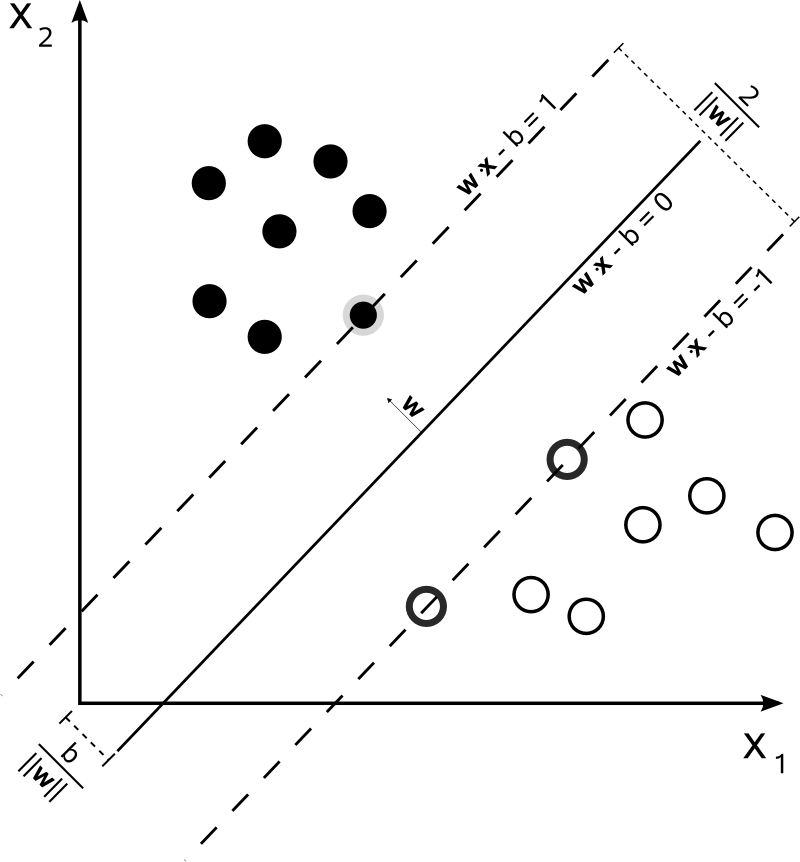

검은색과 하얀색점들을 분류할 때 가장 적절한 것은 실선입니다. SVM에서 이 실선을 찾는 방법을 설명드리겠습니다.

SVM에서는 각 영역에서 가장 끝에 있는 점들을 이은 선 사이의 거리를 최대로 하는 선을 찾습니다. 그 거리는 margin이라고 합니다.

간략하게 설명하고 넘어가겠습니다.

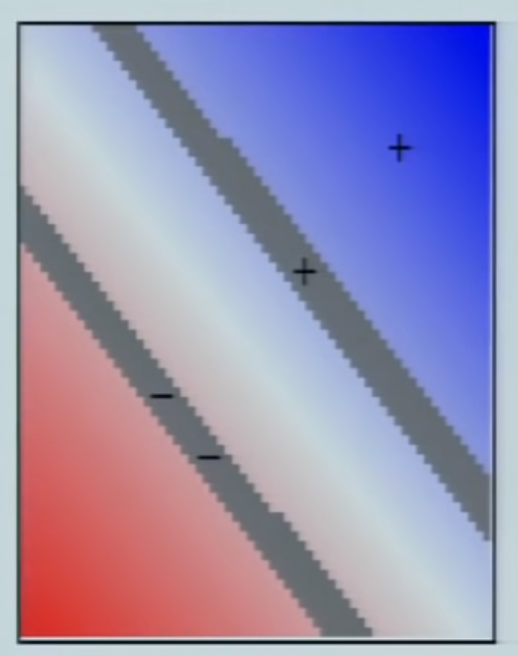

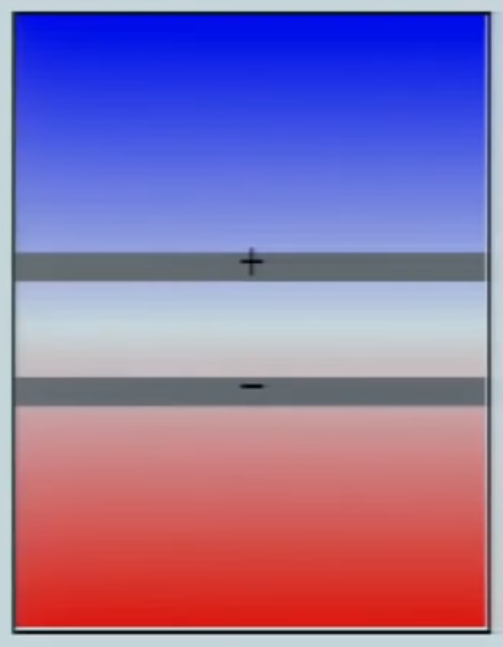

So far, we've seen a range of different algorithms

-With supervised learning algorithms - performance is pretty similar

--What matters more often is;

---The amount of training data

---Skill of applying algorithms

One final supervised learning algorithm that is widely used - support vector machine (SVM)

-Compared to both logistic regression and neural networks, a SVM sometimes gives a cleaner way of learning non-linear functions

-Later in the course we'll do a survey of different supervised learning algorithms

## An alternative view of logistic regression

Start with logistic regression, see how we can modify it to get the SVM

-As before, the logistic regression hypothesis is as follows

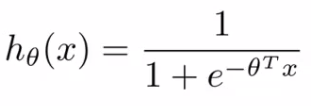

-And the sigmoid activation function looks like this

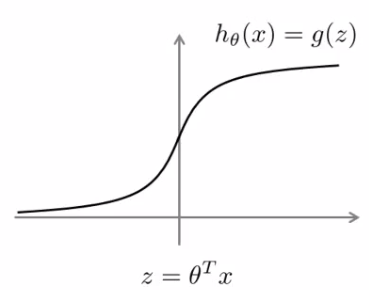

-In order to explain the math, we use z as defined above

What do we want logistic regression to do?

-We have an example where y = 1

--Then we hope hθ(x) is close to 1

--With hθ(x) close to 1, (θT x) must be much larger than 0

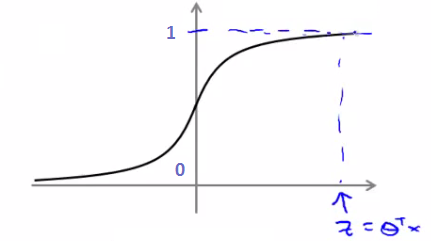

-Similarly, when y = 0

--Then we hope hθ(x) is close to 0

--With hθ(x) close to 0, (θT x) must be much less than 0

-This is our classic view of logistic regression

--Let's consider another way of thinking about the problem

Alternative view of logistic regression

-If you look at cost function, each example contributes a term like the one below to the overall cost function

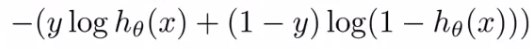

--For the overall cost function, we sum over all the training examples using the above function, and have a 1/m term

If you then plug in the hypothesis definition (hθ(x)), you get an expanded cost function equation;

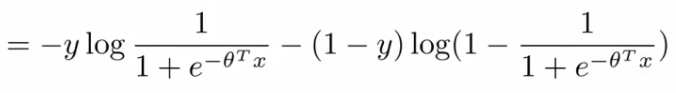

-So each training example contributes that term to the cost function for logistic regression

If y = 1 then only the first term in the objective matters

-If we plot the functions vs. z we get the following graph

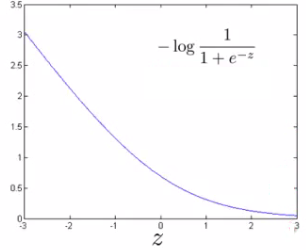

--This plot shows the cost contribution of an example when y = 1 given z

---So if z is big, the cost is low - this is good!

---But if z is 0 or negative the cost contribution is high

---This is why, when logistic regression sees a positive example, it tries to set θT x to be a very large term

If y = 0 then only the second term matters

-We can again plot it and get a similar graph

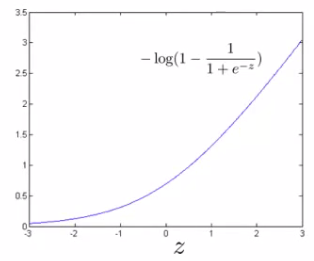

--Same deal, if z is small then the cost is low

---But if s is large then the cost is massive

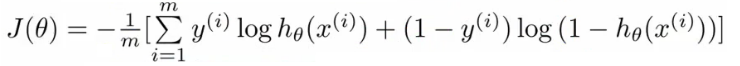

## SVM cost functions from logistic regression cost functions

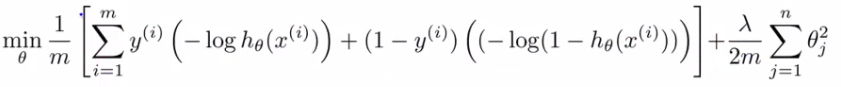

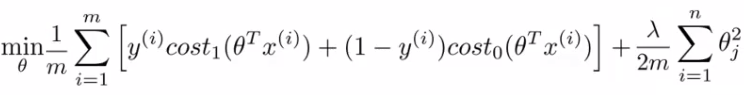

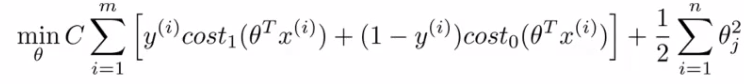

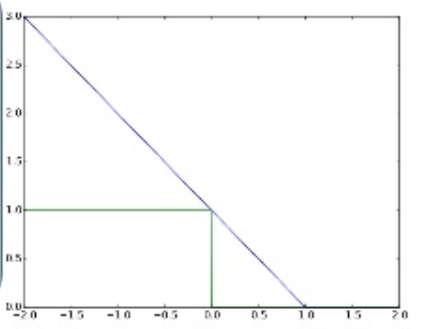

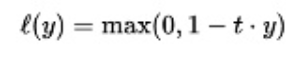

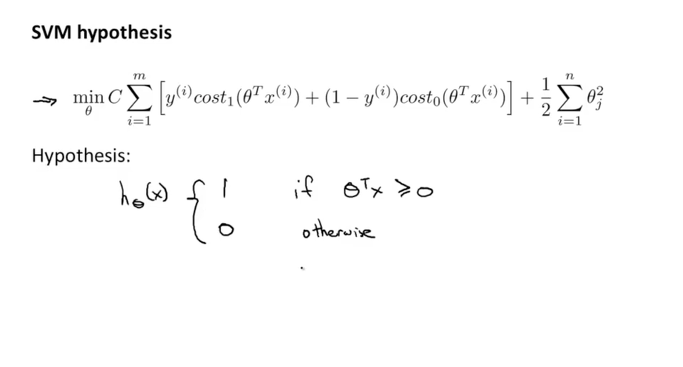

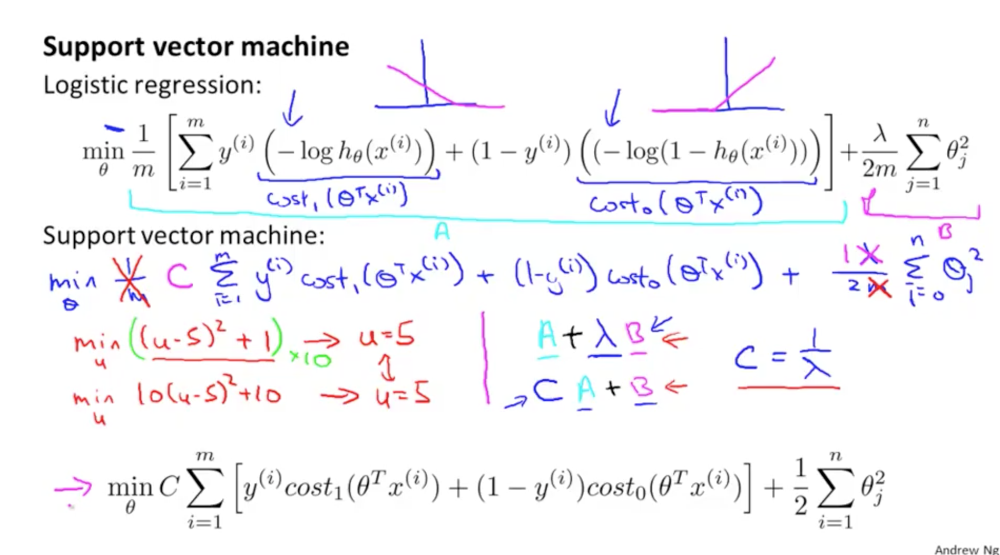

To build a SVM we must redefine our cost functions

-When y = 1

--Take the y = 1 function and create a new cost function

--Instead of a curved line create two straight lines (magenta) which acts as an approximation to the logistic regression y = 1 function

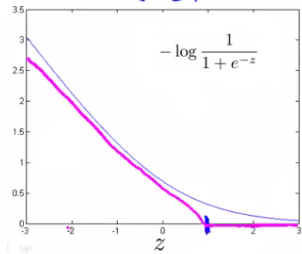

--Take point (1) on the z axis

---Flat from 1 onwards

---Grows when we reach 1 or a lower number

--This means we have two straight lines

---Flat when cost is 0

---Straight growing line after 1

-So this is the new y=1 cost function

--Gives the SVM a computational advantage and an easier optimization problem

--We call this function cost1(z) 

Similarly

-When y = 0

--Do the equivalent with the y=0 function plot

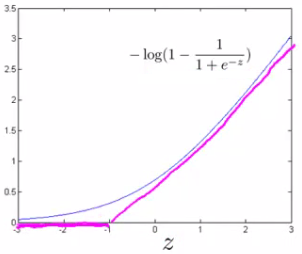

---We call this function cost0(z)

So here we define the two cost function terms for our SVM graphically

-How do we implement this?

## The complete SVM cost function

As a comparison/reminder we have logistic regression below

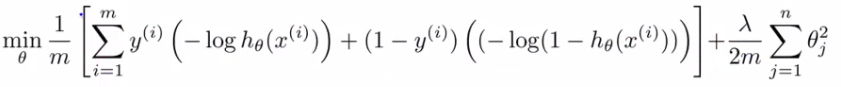

-If this looks unfamiliar its because we previously had the - sign outside the expression

For the SVM we take our two logistic regression y=1 and y=0 terms described previously and replace with

-cost1(θT x)

-cost0(θT x)

So we get

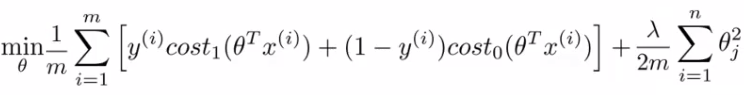

# Large margin intuition

설명에 앞서 초평면 Hyperplane에 대해 설명드리겠습니다.

초평면 Hyperplane이란 원점을 알 수 없는 평면입니다.

두 개의 클래스로 나뉘어진 데이터 포인트들을 나눌수 있는 초평면을 분리 초평면이라고 합니다.

Sometimes people refer to SVM as large margin classifiers

-We'll consider what that means and what an SVM hypothesis looks like

-The SVM cost function is as above, and we've drawn out the cost terms below

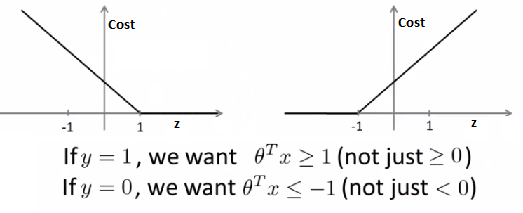

-Left is cost1 and right is cost0

-What does it take to make terms small

--If y =1

---cost1(z) = 0 only when z >= 1

--If y = 0

---cost0(z) = 0 only when z <= -1

-Interesting property of SVM

--If you have a positive example, you only really need z to be greater or equal to 0 

---If this is the case then you predict 1

--SVM wants a bit more than that - doesn't want to *just* get it right, but have the value be quite a bit bigger than zero

---Throws in an extra safety margin factor

Logistic regression does something similar

What are the consequences of this?

-Consider a case where we set C to be huge

--C = 100,000

--So considering we're minimizing CA + B

---If C is huge we're going to pick an A value so that A is equal to zero

---What is the optimization problem here - how do we make A = 0?

--Making A = 0

---If y = 1

----Then to make our "A" term 0 need to find a value of θ so (θT x) is greater than or equal to 1

---Similarly, if y = 0

----Then we want to make "A" = 0 then we need to find a value of θ so (θT x) is equal to or less than -1

--So - if we think of our optimization problem a way to ensure that this first "A" term is equal to 0, we re-factor our optimization problem into just minimizing the "B" (regularization) term, because 

---When A = 0 --> A*C = 0 

--So we're minimizing B, under the constraints shown below

C의 값이 상당히 큰 값이라고 가정을 해보겠습니다. minimize가 되어야 하기 때문에 cost1, cost0로 구성되어진 공식의 값이 0이 되야 합니다.

다시 이 cost1, cost0의 값이 0이 되기 위해서는 θtrans * x 의 값이 y가 1일때는 1보다 크거나 같아야 하고, 
y가 0일 때는 -1 보다 작거나 같아야 한다는 것을 알 수 있습니다.

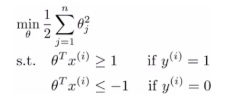

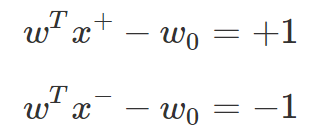

그렇게 위의 조건이 만족되게 되면 결국 C의 값과 곱해지는 cost1, cost0로 구성되는 값이 0이 되어 사라지게 되고 다음과 같이 뒷부분의 공식만 남게 됩니다. 

그 부분이 Decision Boundary

-Turns out when you solve this problem you get interesting decision boundaries

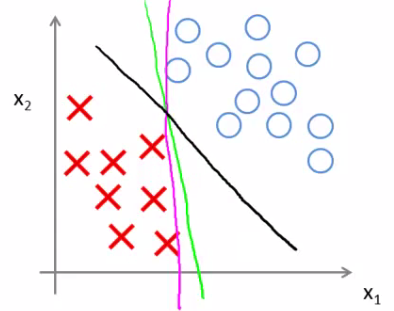

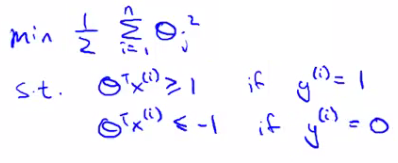

-The green and magenta lines are functional decision boundaries which could be chosen by logistic regression

--But they probably don't generalize too well

-The black line, by contrast is the the chosen by the SVM because of this safety net imposed by the optimization graph

--More robust separator

-Mathematically, that black line has a larger minimum distance (margin) from any of the training examples

검정선의 Decision Boundary가 실제 dataset과의 일정한 거리를 두고 존재하게 되는데 이 간격을 margin이라고 합니다. 

이로 인해서 SVM이 Large Margin 의 알고리즘이 되는 것입니다. 

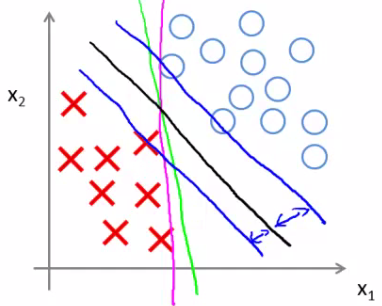

-By separating with the largest margin you incorporate robustness into your decision making process

We looked at this at when C is very large

-SVM is more sophisticated than the large margin might look

--If you were just using large margin then SVM would be very sensitive to outliers 

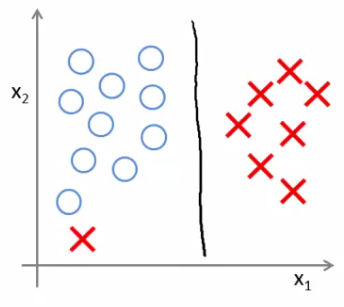

--You would risk making a ridiculous hugely impact your classification boundary

---A single example might not represent a good reason to change an algorithm

---If C is very large then we do use this quite naive maximize the margin approach

다시 한번 살펴보면, 왼쪽에는 모두 O의 data가 있고 오른쪽에는 모두 X의 data로만 존재하는 dataset이 있다고 생각해보면 아래의 검정색 직선과 같이 세로의 직선으로 구분이 될 것입니다. 

C는 오류를 어느 정도 허용하겠냐 를 판단해주는 결정해주는 역할을 합니다.

여기에서 만약 새로운 데이터가 추가 되었는데 왼쪽 아래에 X가 생겼다고 해보겠습니다.

이때 만약 C가 상당히 큰 값을 가지고 있다면, 검정색 직선의 Decision Boundary는 빨간색의 직선으로 이동하게 됩니다. 

반대로 만약 C가 아주 작은 값을 가지고 있다면, 검정색 직선의 Decision Boundary는 이동하지 않게 될 것입니다.

저희는 C가 1 / lambda와 비슷한 것을 알고 있습니다. 

즉 정규화의 개념인 람다의 역수가 된 것이 바로 C가 의미하는 것입니다. 

이것은 C를 조절하여 linear 한 decision boundary를 만들수도 있고 또는 dataset에 따라서 non-linear 한 decision boundary를 만들수도 있다는 것을 의미합니다.

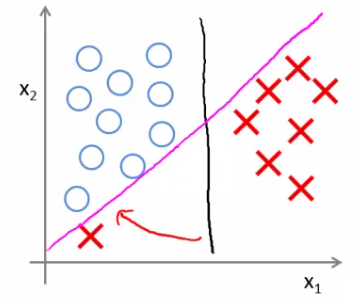

---So we'd change the black to the magenta

--But if C is reasonably small, or a not too large, then you stick with the black decision boundary

-What about non-linearly separable data?

--Then SVM still does the right thing if you use a normal size C

--So the idea of SVM being a large margin classifier is only really relevant when you have no outliers and you can easily linearly separable data

-Means we ignore a few outliers 

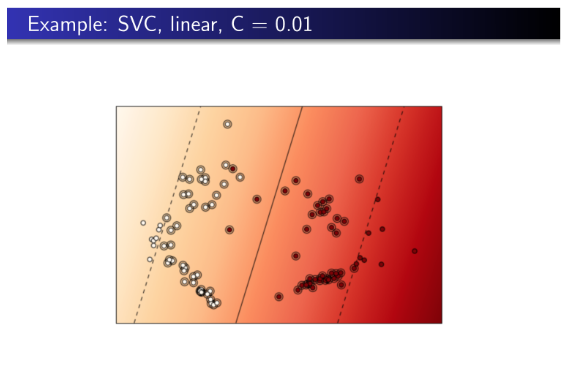

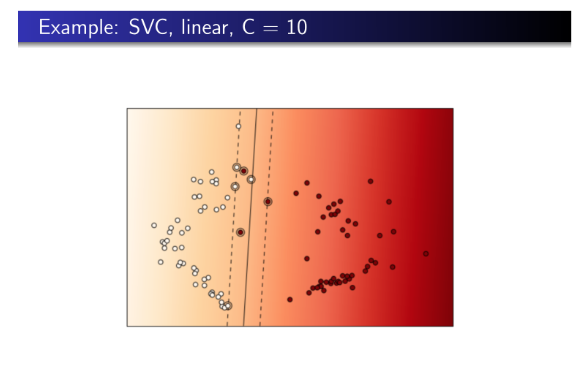

# Large margin classification mathematics (optional)

## Vector inner products 

참고 자료 [https://www.youtube.com/watch?v=_PwhiWxHK8o]

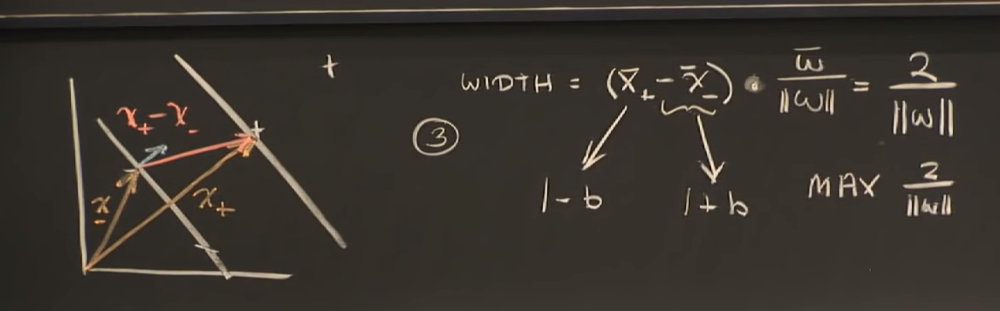

아래 그림과 같이 두개의 벡터 u, v가 있습니다. 

각각 2개의 값을 가지고 있고 이 두개의 벡터의 곱에 대해서 생각해보겠습니다. 

u 벡터는 파란색의 u1, u2의 좌표를 갖는 원점에서 시작하는 벡터가 되고 

v 벡터는 v1, v2의 좌표를 향하는 원점에서의 벡터로 분홍색으로 표시가 되었습니다. 

여기서 v 벡터를 u 벡터에 투영을 한다고 생각을 하고 녹색의 직각의 선을 그어볼 수 있습니다. 

그럼 빨간색으로 표현된 길이만큼의 새로운 p가 생깁니다. 

p 는 v 벡터를 u 벡터에 투영을 하여 생성된 길이를 의미하고 이 값은 + or - 의 값을 가질 수 있습니다.

이것을 수식으로 표현을 하면 uT v = p * ||u|| 입니다.

여기서 ||u|| 은 u 벡터의 norm이라고 읽으며 벡터의 길이를 의미합니다. 또 ||u|| = SQRT(u1^2 + u2^2) 와 같은 값을 가집니다.

두개의 벡터의 곱하기는 uT v = u1v1+ u2v2 이 되며, 

p * ||u|| = u1v1+ u2v2 이 됩니다. 두개의 벡터는 교환법칙이 성립하므로 uT v = vT u도 가능합니다.

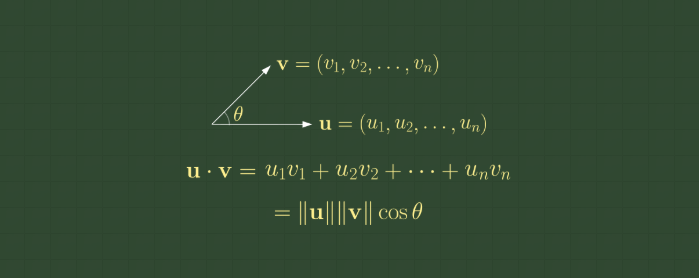

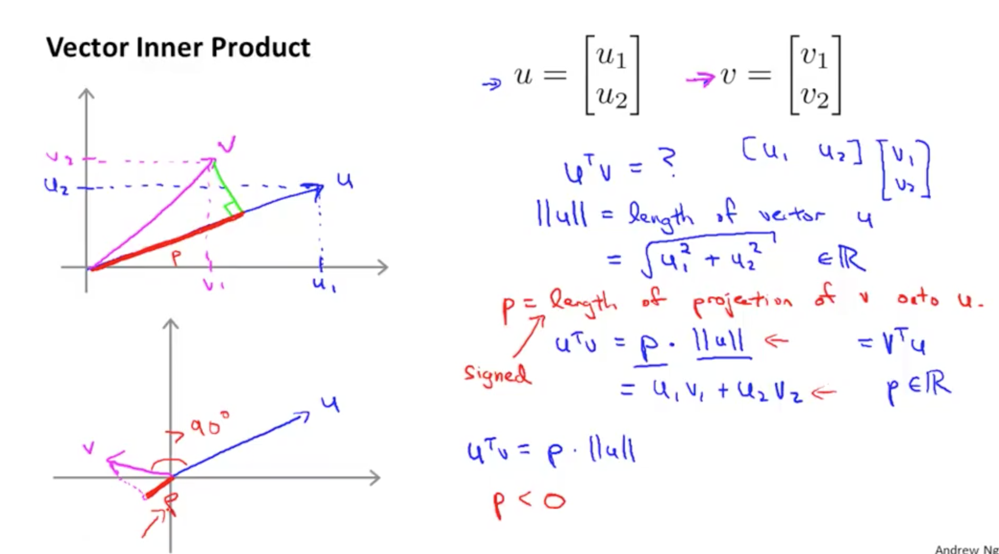

Have two (2D) vectors u and v - what is the inner product (uT v)?

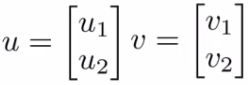

-Plot u on graph

--i.e u1 vs. u2

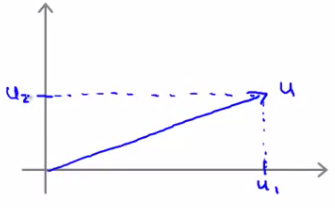

-One property which is good to have is the norm of a vector

--Written as ||u||

---This is the euclidean length of vector u

--So ||u|| = SQRT(u12 + u22) = real number

---i.e. length of the arrow above

---Can show via Pythagoras 

-For the inner product, take v and orthogonally project down onto u

--First we can plot v on the same axis in the same way (v1 vs v1)

--Measure the length/magnitude of the projection

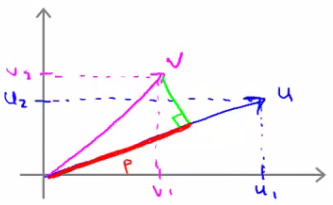

--So here, the green line is the projection

---p = length along u to the intersection

---p is the magnitude of the projection of vector v onto vector u

-Possible to show that

--uT v = p * ||u||

---So this is one way to compute the inner product

--uT v = u1v1+ u2v2

--So therefore

---p * ||u|| = u1v1+ u2v2

---This is an important rule in linear algebra

--We can reverse this too

---So we could do 

----vT u = v1u1+ v2u2

----Which would obviously give you the same number

-p can be negative if the angle between them is 90 degrees or more

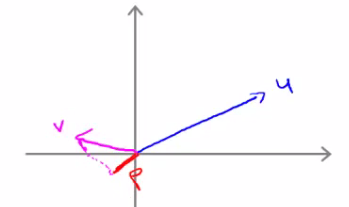

--So here p is negative

Use the vector inner product theory to try and understand SVMs a little better

## SVM decision boundary

x 벡터를 세타 벡터에 투영을 하여 생성된 길이 p(i)는 빨간색 선이 됩니다. 

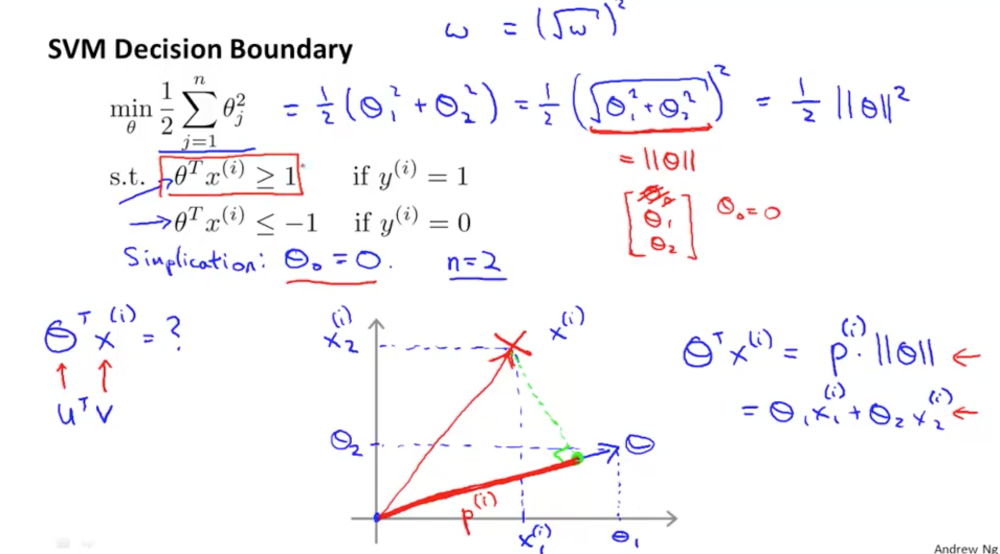

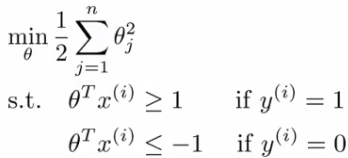

For the following explanation - two simplification

-Set θ0= 0 (i.e. ignore intercept terms)

-Set n = 2 - (x1, x2)

--i.e. each example has only 2 features

Given we only have two parameters we can simplify our function to

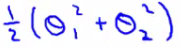

And, can be re-written as 

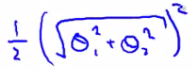

-Should give same thing 

We may notice that

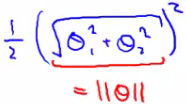

-The term in red is the norm of θ

--If we take θ as a 2x1 vector

--If we assume θ0 = 0 its still true

So, finally, this means our optimization function can be re-defined as 

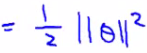

So the SVM is minimizing the squared norm

Given this, what are the (θT x) parameters doing?

-Given θ and given example x what is this equal to

--We can look at this in a comparable manner to how we just looked at u and v

-Say we have a single positive training example (red cross below)

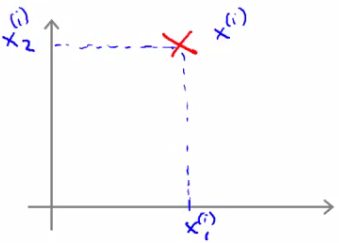

-Although we haven't been thinking about examples as vectors it can be described as such

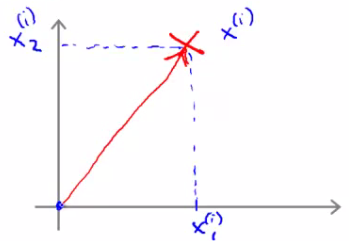

-Now, say we have our parameter vector θ and we plot that on the same axis

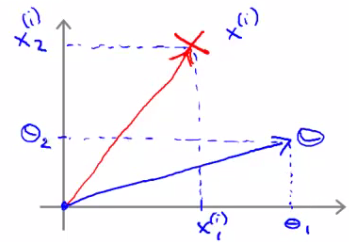

-The next question is what is the inner product of these two vectors

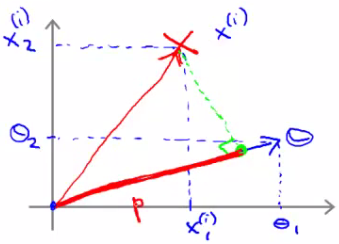

--p, is in fact pi, because it's the length of p for example i

---Given our previous discussion we know 
(θT xi ) = pi * ||θ||
           = θ1xi1 + θ2xi2 

---So these are both equally valid ways of computing θT xi

What does this mean?

-The constraints we defined earlier 

--(θT x) >= 1 if y = 1

--(θT x) <= -1 if y = 0

-Can be replaced/substituted with the constraints

--pi * ||θ|| >= 1 if y = 1

--pi * ||θ|| <= -1 if y = 0

-Writing that into our optimization objective 

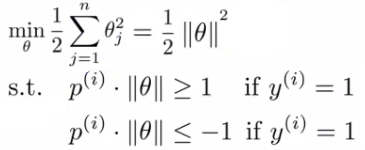

y(i)가 1일때는 θT xi의 값이 1보다 크거나 같아야 합니다. 

이것은 다시 pi * ||θ|| 가 1보다 크거나 같다는 것과 동일합니다. 

반대의 경우도 마찬가지로 y(i)가 0일때는 θT xi의 값이 -1보다 작거나 같아야 하고 

이것은 pi * ||θ|| 이 -1보다 작거나 같은 것과 동일합니다. 

여기서 p(i)는 x(i)를 세타에 투영하여 생성된 길이를 의미합니다.

Decision Boundary가 대각선인 경우를 생각해보겠습니다. 

이때 직각으로 세타 벡타가 생성이 됩니다. 

이 세타 벡터에 각각의 X, O의 x data 들을 투영해서 생성된 길이 p(i)를 보면 상당히 작은 값을 가진 다는 것을 알 수 있습니다. 

이것은 다시 말하면 세타의 norm의 크기가 커야 값이 1 이상의 값을 가질 수 있으며 

반대로도 크기가 커야 값이 -1이하의 값을 가질 수 있는 것을 알 수 있습니다.

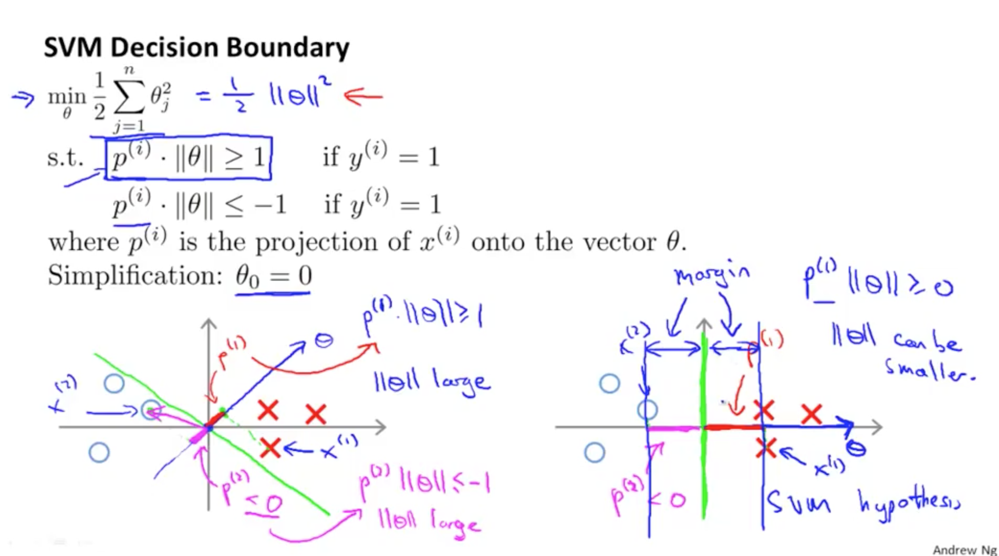

So, given we've redefined these functions let us now consider the training example below

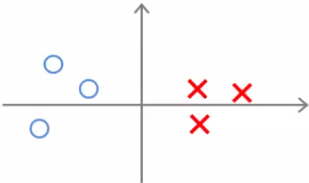

-Given this data, what boundary will the SVM choose? Note that we're still assuming θ0 = 0, which means the boundary has to pass through the origin (0,0)

--Green line - small margins

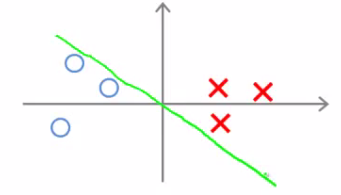

---SVM would not chose this line

----Decision boundary comes very close to examples

----Lets discuss why the SVM would not chose this decision boundary

-Looking at this line 

--We can show that θ is at 90 degrees to the decision boundary

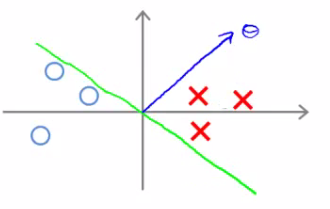

--θ is always at 90 degrees to the decision boundary (can show with linear algebra, although we're not going to!)

So now lets look at what this implies for the optimization objective

-Look at first example (x1)

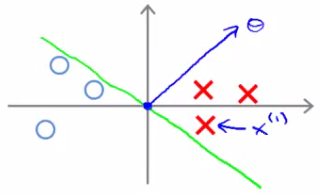

-Project a line from x1 on to to the θ vector (so it hits at 90 degrees)

--The distance between the intersection and the origin is (p1)

-Similarly, look at second example (x2)

--Project a line from x2 into to the θ vector

--This is the magenta line, which will be negative (p2)

-If we overview these two lines below we see a graphical representation of what's going on;

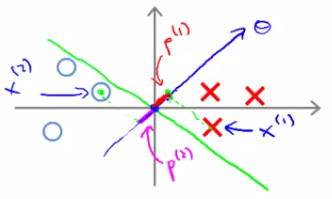

-We find that both these p values are going to be pretty small

-If we look back at our optimization objective 

--We know we need p1 * ||θ|| to be bigger than or equal to 1 for positive examples

---If p is small

----Means that ||θ|| must be pretty large

--Similarly, for negative examples we need p2 * ||θ|| to be smaller than or equal to -1

---We saw in this example p2 is a small negative number

----So ||θ|| must be a large number

-Why is this a problem?

--The optimization objective is trying to find a set of parameters where the norm of theta is small

---So this doesn't seem like a good direction for the parameter vector (because as p values get smaller ||θ|| must get larger to compensate)

----So we should make p values larger which allows ||θ|| to become smaller

So lets chose a different boundary

Decision Boundary가 세로선인 경우를 생각해보겠습니다. 


이때 직각으로 세타 벡타가 생성이 되고 거의 x 축과 같아집니다. 

x data들을 투영하여 생성된 길이 p(i)는 보다 큰 값을 가지게 되고 이것은 다시 이야기하면 세타의 norm의 크기가 작아도 되는 결과가 됩니다.

이렇게 p가 커진다는 것은 Decision Boundary와 data간의 거리가 길어지는 것을 의미하며 이 gap이 margin이 됩니다. 

margin이 크게 형성 되는 Decision Boundary가 좋은 것이라고 할 수 있습니다.

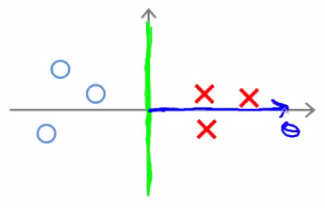

-Now if you look at the projection of the examples to θ we find that p1 becomes large and ||θ|| can become small

-So with some values drawn in

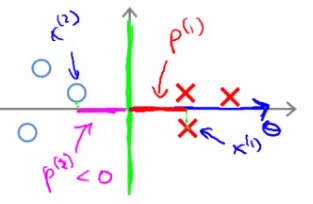

-This means that by choosing this second decision boundary we can make ||θ|| smaller

--Which is why the SVM choses this hypothesis as better 

--This is how we generate the large margin effect

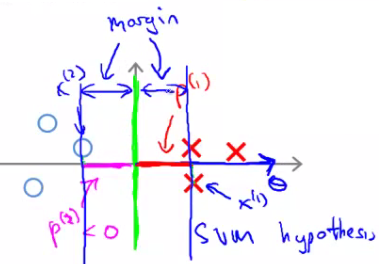

--The magnitude of this margin is a function of the p values

---So by maximizing these p values we minimize ||θ|| 

Finally, we did this derivation assuming θ0 = 0,

-If this is the case we're entertaining only decision boundaries which pass through (0,0)

-If you allow θ0 to be other values then this simply means you can have decision boundaries which cross through the x and y values at points other than (0,0)

-Can show with basically same logic that this works, and even when θ0 is non-zero when you have optimization objective described above (when C is very large) that the SVM is looking for a large margin separator between the classes

# Kernels - 1: Adapting SVM to non-linear classifiers

초평면에서는 두 개의 클래스만을 분류가능했습니다. 이러한 문제점을 해결하기 위해 나온것이 kernel입니다.

어떤 변수 공간에 kernel함수를 사용하여 그 공간을 확장시키는 방법입니다.

즉, kernel함수로 데이터 경계를 설정하는 결정 경계면을 계산하고 클래스를 분류합니다.

non-linear할 때 공간을 확장하여 linear하게 분류가 가능합니다.

What are kernels and how do we use them

-We have a training set

-We want to find a non-linear boundary

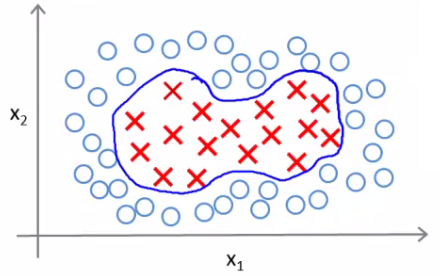

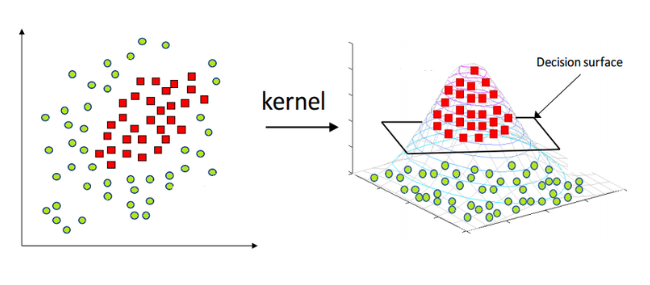



위와 같은 training set이 있다고 한다면 저희는 nonlinear구분에 알맞은 decision boundary를 찾아야 합니다. 

저희는 한 방법으로 complex polynomial feature들을 통해서 위 사항을 만족하는 decision boundary를 찾을 수도 있습니다.

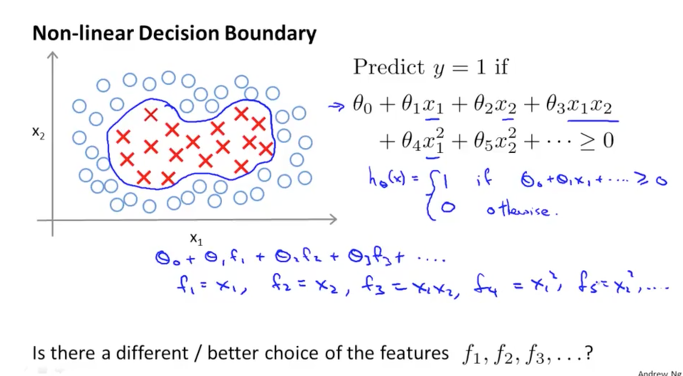

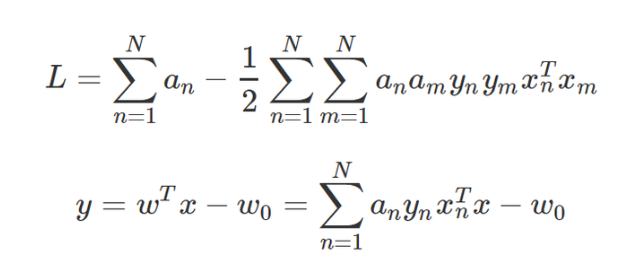

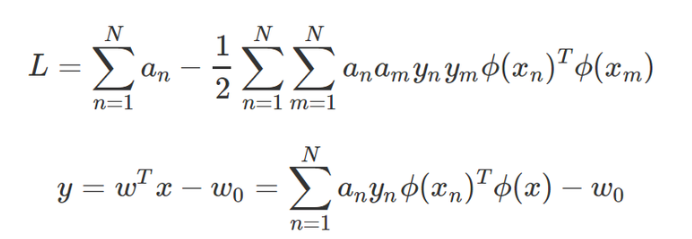

새로 정의한 feature들이라고 생각하시면 됩니다. f가 x와 같은 경우가 일반적인 형태가 되는 것입니다.

f값이 x의 고차원 다항식(high order polynomials)로 표현됐습니다.

고차원 다항식는 매우 계산량이 많이 필요합니다.

사용하기 좋은 features를 선택할 수 있는 방법은 없을까요?

-Come up with a complex set of polynomial features to fit the data

--Have hθ(x) which 

---Returns 1 if the combined weighted sum of vectors (weighted by the parameter vector) is less than or equal to 0

---Else return 0

--Another way of writing this (new notation) is

---That a hypothesis computes a decision boundary by taking the sum of the parameter vector multiplied by a new feature vector f, which simply contains the various high order x terms

---e.g.

----hθ(x) = θ0+ θ1f1+ θ2f2 + θ3f3

----Where

-----f1= x1

-----f2 = x1x2

-----f3 = ...

-----i.e. not specific values, but each of the terms from your complex polynomial function

--Is there a better choice of feature f than the high order polynomials?

---As we saw with computer imaging, high order polynomials become computationally expensive

New features 

-Define three features in this example (ignore x0)

-Have a graph of x1 vs. x2 (don't plot the values, just define the space)

-Pick three points in that space

임의의 세 개의 점은 l이라고 하고 이것은 수동으로 선택한 point, landmarks라고 합니다.

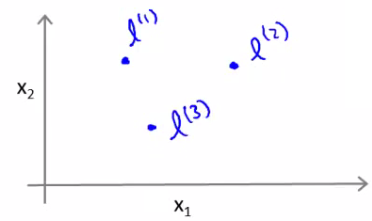

-These points l1, l2, and l3, were chosen manually and are called landmarks

--Given x, define f1 as the similarity between (x, l1)

--- = exp(- (|| x - l1 ||2 ) / 2σ2)

주어진 x와 l들을 가지고 새 feature인 f를 계산합니다. f의 계산은 x와 l의 유사도를 계산하는 것입니다.

그래서 f를 (x, l)에 대한 similarity(유사성)의 함수라고 하겠습니다.

이것을 수학적으로 나타내면 다음과 같습니다.

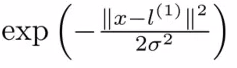

윗 부분은 거리가 됩니다. 아랫 부분을 보면 시그마는 표준편차, 시그마제곱은 분산으로 유사도를 계산하는 과정입니다.

exp는 가우시안 kernel을 뜻합니다.

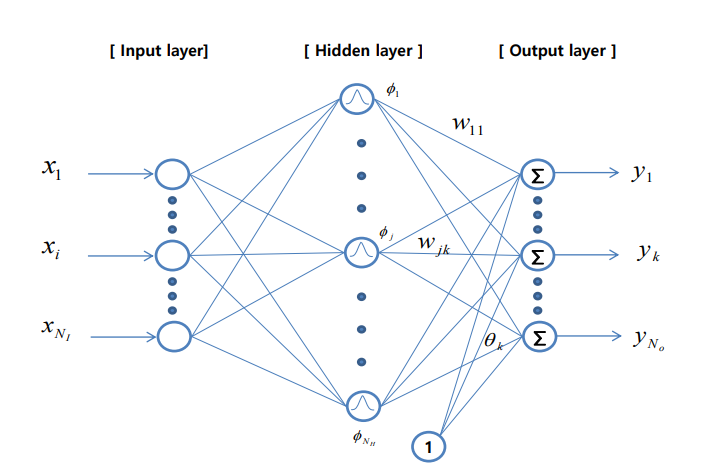

---|| x - l1 || is the euclidean distance between the point x and the landmark l1 squared

----Disussed more later

---If we remember our statistics, we know that 

----σ is the standard deviation

----σ2 is commonly called the variance

--Remember, that as discussed

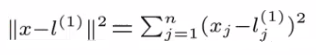

x가 l과 비슷하다면(거리) 밑의 값이 0이 되며 결국 f1은 1에 가까운 값을 가지게 될 것입니다. 

또 반대로 x가 l과 멀고(거리) 다를 수록 분자의 값이 큰값이 되며 이것은 결국 f1의 값이 0에 가깝게 되는 특징을 알 수 있습니다.

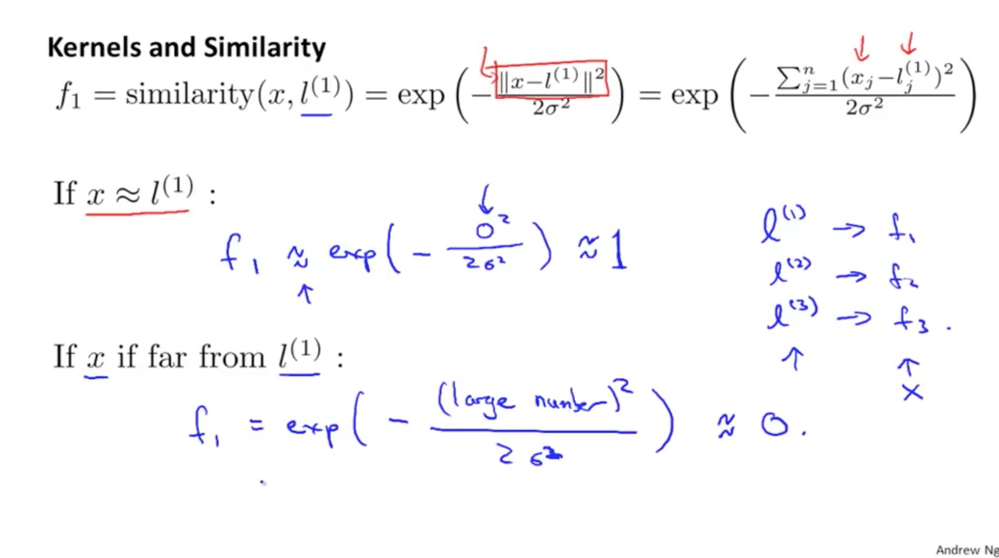

-So, f2 is defined as

--f2 = similarity(x, l1) = exp(- (|| x - l2 ||2 ) / 2σ2)

-And similarly

--f3 = similarity(x, l2) = exp(- (|| x - l1 ||2 ) / 2σ2)

-This similarity function is called a kernel

--This function is a Gaussian Kernel

-So, instead of writing similarity between x and l we might write

--f1 = k(x, l1)

## Diving deeper into the kernel

So lets see what these kernels do and why the functions defined make sense

-Say x is close to a landmark

--Then the squared distance will be ~0

---So

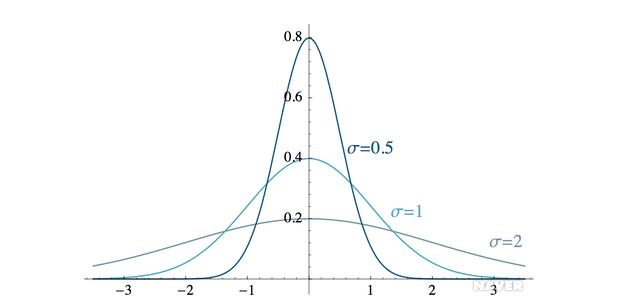

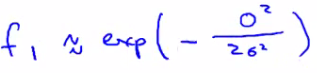

----Which is basically e-0

-----Which is close to 1

--Say x is far from a landmark

---Then the squared distance is big

----Gives e-large number

-----Which is close to zero

--Each landmark defines a new features

If we plot f1 vs the kernel function we get a plot like this

-Notice that when x = [3,5] then f1 = 1

-As x moves away from [3,5] then the feature takes on values close to zero

-So this measures how close x is to this landmark

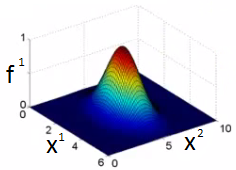

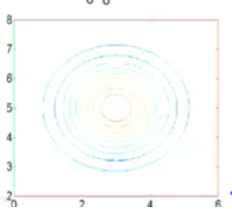

## What does σ do?

σ2 is a parameter of the Gaussian kernel

-Defines the steepness of the rise around the landmark

Above example σ2 = 1

Below σ2 = 0.5

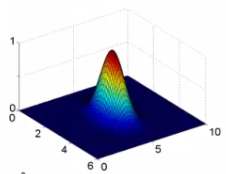

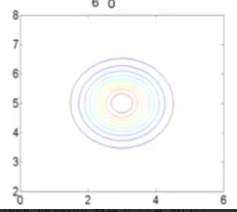

-We see here that as you move away from 3,5 the feature f1 falls to zero much more rapidly

The inverse can be seen if σ2 = 3

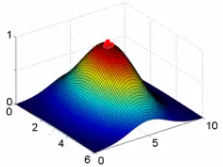

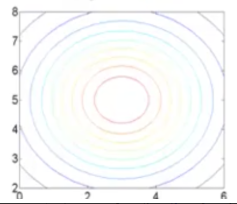

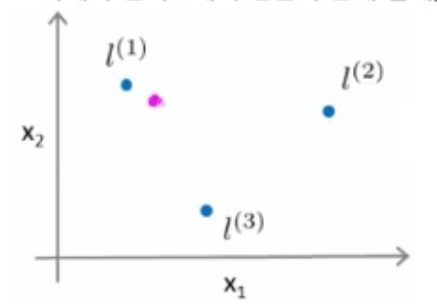

θ0 = 0.5, θ1 = 1, θ2 = 1, θ3 = 0

-0.5 + (1*1) + (1*0) + (0*0) = 0.5


# Kernel 2

어떻게 landmark들을 얻을 수 있는가에 대해 궁금했습니다.

Machine learning problem이 주어지고 저희는 몇 개의 positive & negative 예제들의 dataset을 가지고 있습니다. 

저희는 landmark들을 정확히 training example들의 위치로 선택합니다. 

아래와 같이 training example x(1)이 있을 때 x(1)을 첫 번째 landmark = l(1)으로 선택하고 

다음으로 training example x(2)를 두 번째 landmark = l(2)로 선택하는 것입니다.

그러면 m개의 training example들이 있을 때 결국 저희는 m개의 landmark들을 선택할 수 있게 됩니다.

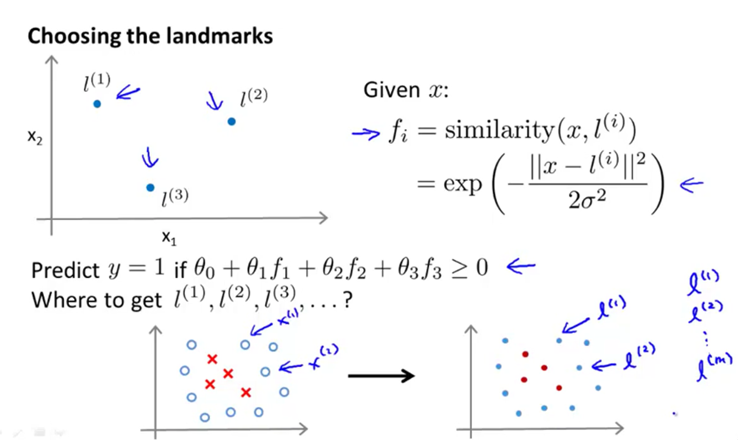

결국 x = l 이기때문에 f는 자기자신과의 유사도를 구하는 것 입니다.

이것은 0이기 때문에 Gaussian kernel에서는 exp(-0)=1이 됩니다. 그렇기 때문에 새로 만든 features(f)중 하나는 값이 1이 됩니다.


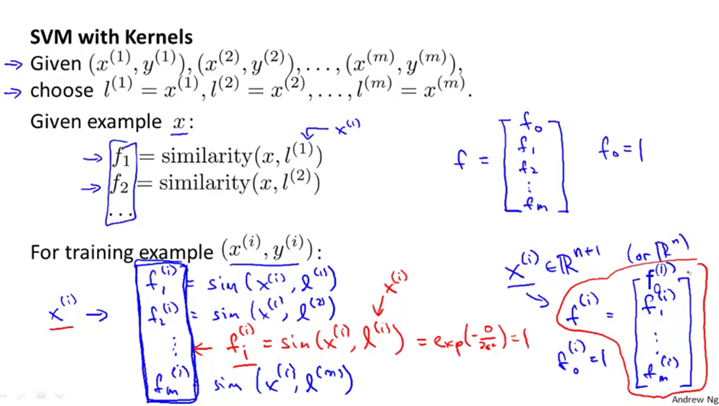

f를 이렇게 정의할 수 있습니다.

Hypothesis 는 x가 주어졌을 때 feature vector f를 계산하고 세타trans*f가 0보다 클 때 y=1로 예측됩니다.

이제 x 대신에 f로 바꿔줍니다.

거리를 나타내는 같은 방법으로 바꿀수 있습니다.(세타)

M은 사용할 kernel에 따라 값이 다릅니다.

쓰는 이유는 이것이 더 큰 training set들이 주어졌을 때 scaling할 수 있기 때문입니다. 

이전 방식을 사용하면, 예를 들어 10000 training examples이 있다고 할 때 저희는 landmarks를 10000개 만들어야 합니다. 

이것은 아마도 잘 작동하겠지만 m이 매우 큰 50000 or 100000일 경우에는 minimization problem을 푸는데 매우 오랜 시간이 걸릴 것입니다.

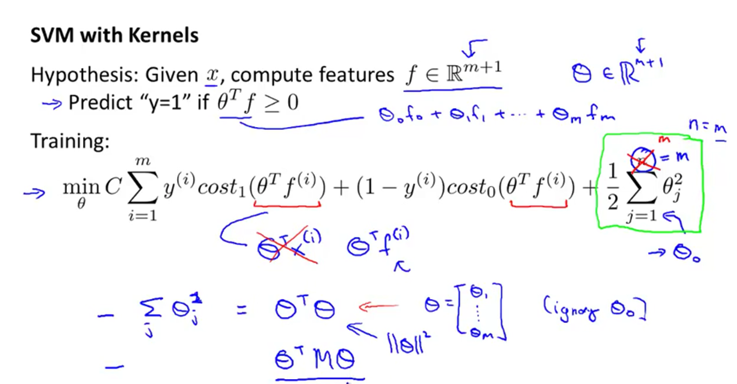

# SVM - implementation and use

SVM을 사용할때 선택해야 하는 내용이 두가지 있습니다.

하나는 prarmeter C를 선택해야 하고 또 하나는 kernel을 선택해야 합니다. 

kernel이 없는 경우는 linear kernel이라고 하며 이것은 f 함수(similarity function)을 사용하지 않고 x features 를 사용하는 것입니다. 

주로 n 이 크고 m이 작은 즉 features는 많은데 dataset 사이즈가 적은 경우에 사용이 됩니다.

Gaussian kernel을 사용하는 경우에는 sigma^2 값을 선택해야 합니다. 

이것은 n 이 작고 m 이 큰  non-linear 에서 유용하게 사용됩니다. 

SVM을 사용할 때 우리가 선택해야 할 parameter인 C를 선택해야 합니다. 

C는 1/ramda와 같은 역할을 합니다. 

1/ramda는 logistic regression 에서 regularization parameter로 사용했습니다. 

만약 C가 큰 값이라면 small 가 되고, regularization정도가 약함을 의미합니다. 

결관 Lower bias, high variance 입니다. 

반면에 C값이 작으면 large 가 되고, regularization정도가 강함을 의미합니다. 

결관 higher bias, low variance입니다. 

C값이 큰 hypothesis는 high variance이고 overfitting하는 경향이 있습니다. 

반면에 C값이 작은 hypothesis는 higher bias이고 underfitting하기 쉽습니다.

Gaussian kernel에서 sigma^2 값을 선택해야 합니다. 
 
sigma^2 값이 크면 f값의 퍼짐의 정도가 커지게 되고 이는 C값이 작은 것과 유사합니다. 

만약 f값이 smoothly하게 감소하면 input x가 변함에 따라 hypothesis도 천천히 변화하거나 smoothly하게 변화합니다. 

반면에 가 작으면 f값이 급하게 변화합니다. 

f값들이 덜 smoothly하게 변화하며 lower bias, higher variance가 됩니다.

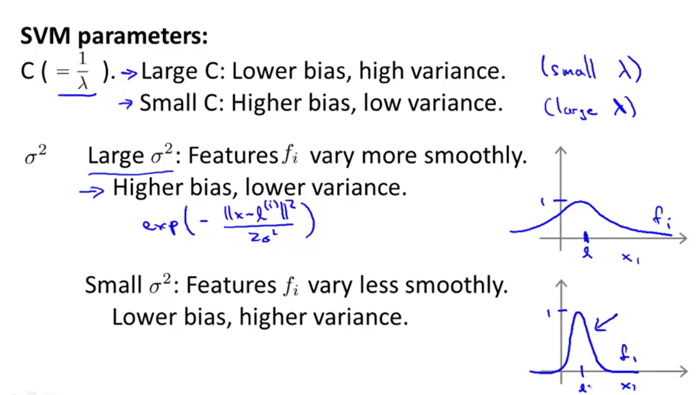

So far spoken about SVM in a very abstract manner

What do you need to do this

-Use SVM software packages (e.g. liblinear, libsvm) to solve parameters θ

-Need to specify

--Choice of parameter C

--Choice of kernel

## Multi-class classification for SVM

Many packages have built in multi-class classification packages

Otherwise use one-vs all method

Not a big issue

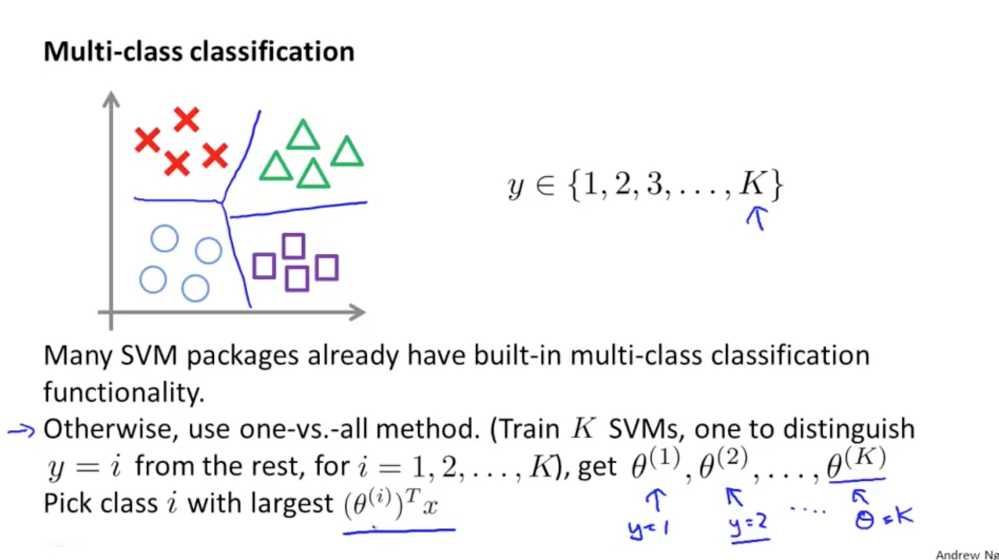

SVM도 multi-class classifacation이 가능합니다. 

비슷한 방식으로 one vs all method를 사용하고 있습니다. 

y의 값이 1에서 부터 k 까지 존재한다면 세타도 1에서 부터 k 까지 생성이 되며 각각의 세타는 y의 값과 매칭이 됩니다.

## Logistic regression vs. SVM

When should you use SVM and when is logistic regression more applicable

If n (features) is large vs. m (training set)

-e.g. text classification problem

--Feature vector dimension is 10 000

--Training set is 10 - 1000

--Then use logistic regression or SVM with a linear kernel

If n is small and m is intermediate

-n = 1 - 1000

-m = 10 - 10 000

-Gaussian kernel is good

If n is small and m is large

-n = 1 - 1000

-m = 50 000+

--SVM will be slow to run with Gaussian kernel

-In that case

--Manually create or add more features

--Use logistic regression of SVM with a linear kernel

Logistic regression and SVM with a linear kernel are pretty similar //되게 비슷하다.

-Do similar things

-Get similar performance

A lot of SVM's power is using diferent kernels to learn complex non-linear functions

For all these regimes a well designed NN should work

-But, for some of these problems a NN might be slower - SVM well implemented would be faster

SVM has a convex optimization problem - so you get a global minimum //문제점 - g_m찾기

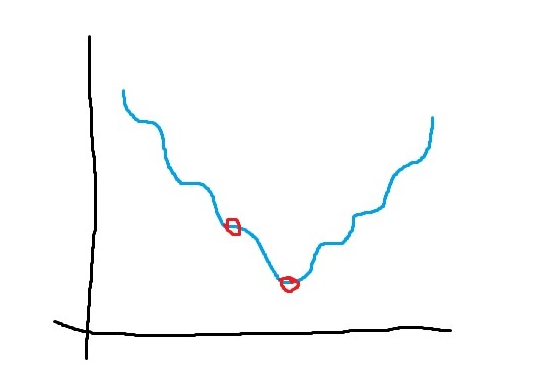

It's not always clear how to chose an algorithm

-Often more important to get enough data

-Designing new features

-Debugging the algorithm

SVM is widely perceived a very powerful learning algorithm

In [2]:
from sklearn.pipeline import Pipeline
basismodel = Pipeline([("basis",FunctionTransformer(basis)),("svc",SVC(kernel="linear"))]).fit(X_xor, y_xor)
plot_xor(X_xor,y_xor,basismodel,"Basis-Function SVC")

NameError: name 'FunctionTransformer' is not defined